In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('MNIST Datasets.zip',compression='zip')

In [3]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
35048,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


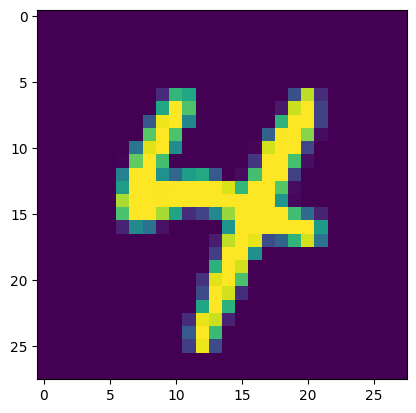

In [5]:
plt.imshow(df.iloc[18610,1:].values.reshape(28,28))


In [6]:
X = df.drop(columns=['label'])
y = df['label']

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [8]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [9]:
df.shape

(42000, 785)

In [10]:
y_pred = knn.predict(X_test)

In [11]:
from sklearn.metrics import accuracy_score
print('Accuracy of model without PCA:',accuracy_score(y_test,y_pred))

Accuracy of model without PCA: 0.9648809523809524


## PCA

In [12]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [13]:
from sklearn.decomposition import PCA
pca = PCA(n_components=400)

X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [14]:
X_train_pca.shape

(33600, 400)

In [15]:
X.shape

(42000, 784)

In [16]:
knn = KNeighborsClassifier()
knn.fit(X_train_pca, y_train)

KNeighborsClassifier()

In [17]:
y_pred_pca = knn.predict(X_test_pca)

In [18]:
from sklearn.metrics import accuracy_score
print('Accuracy of model using PCA:',accuracy_score(y_test,y_pred_pca))

Accuracy of model using PCA: 0.9430952380952381


In [19]:
#Accuracy of model using PCA: 0.9504761904761905 #200

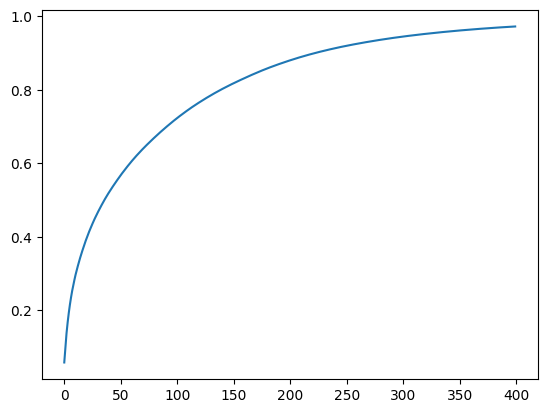

In [20]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

# Ploting 2D plot by using PCA 

In [21]:
pca = PCA(n_components=2)

X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test) 

In [22]:
X_train_pca

array([[-2.7186167 , -0.48983964],
       [-0.67708531, -6.75389644],
       [-3.03318255,  6.50987434],
       ...,
       [ 2.14878052,  0.78072675],
       [ 1.05959203,  0.94782333],
       [17.70255961,  1.96201641]])

In [23]:
import plotly.express as px
y_train_pca = y_train.astype(str)
fig = px.scatter(x=X_train_pca[:,0],
                 y=X_train_pca[:,1],
                 color = y_train_pca,
                 color_discrete_sequence = px.colors.qualitative.G10
                
                )
fig.show()

# Ploting 3D plot by using PCA 

In [24]:
pca = PCA(n_components=3)

X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [25]:
X_train_pca

array([[-2.718639  , -0.48942658,  1.13519775],
       [-0.67695052, -6.75480865, -2.33539005],
       [-3.03325021,  6.5103151 ,  7.49171494],
       ...,
       [ 2.14884905,  0.78016027, -0.74726269],
       [ 1.0595474 ,  0.94868838,  3.94900715],
       [17.70258392,  1.96192895, -4.94391901]])

In [26]:
y_train_pca = y_train.astype(str)
fig = px.scatter_3d(df,x=X_train_pca[:,0],
                 y=X_train_pca[:,1],
                 z=X_train_pca[:,2],
                 color = y_train_pca)
                
fig.update_layout(margin = dict(l=20,r=20,t=20,b=20))
fig.show()